<a href="https://colab.research.google.com/github/amitsharhcl/fastai-v3/blob/master/LANL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
!curl -s https://course.fast.ai/setup/colab | bash

Updating fastai...
Done.


In [0]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [0]:
!pip install -U pyarrow

    100% |████████████████████████████████| 48.5MB 935kB/s 


In [0]:
from fastai.basics import *

In [0]:
from fastai.tabular import *
from fastai.callbacks import SaveModelCallback
from fastai.metrics import mean_absolute_error,mae

In [0]:
!curl --header 'Host: storage.googleapis.com' --user-agent 'Mozilla/5.0 (Windows NT 10.0; Win64; x64; rv:66.0) Gecko/20100101 Firefox/66.0' --header 'Accept: text/html,application/xhtml+xml,application/xml;q=0.9,*/*;q=0.8' --header 'Accept-Language: en,en-US;q=0.5' --referer 'https://www.kaggle.com/' --header 'DNT: 1' --header 'Upgrade-Insecure-Requests: 1' 'https://storage.googleapis.com/kaggle-competitions-data/kaggle/11000/256533/all.zip?GoogleAccessId=web-data@kaggle-161607.iam.gserviceaccount.com&Expires=1556618320&Signature=jjMkLoDkYiHT%2F8sQ6ieEyGxFHEiL0SXqNTC%2FU5Qvc5NVJO0VDSlpWrxirwB3BobNFZzbUl%2FVzgFgPxE3aCmUzDrbwK%2Fzn8CqFpU6dUbJeryge3ZwNEwNRft51X5C58b80xcF2T7mJnjCcXqO1B6oeGvbY0HYmsGlsds0VE3vOvgBgjkDtHsgwyTY4x3YMv%2Bt%2B8HcHyzoucG7wCskJln99y8I1YL%2FN23cZctRoZnH7zWxpZBjN585C%2FEQ0ipWY0TsckfsRP4Ps8jIDzA12bAc56ZGL9zTVybzb73B9dzlnxdZ33mLVKe1HgJQRUSquDXuHc1zDG81aEPLLUf4%2FNRbwg%3D%3D&response-content-disposition=attachment%3B+filename%3DLANL-Earthquake-Prediction.zip' --output 'LANL-Earthquake-Prediction.zip'

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 2316M  100 2316M    0     0   126M      0  0:00:18  0:00:18 --:--:--  125M


In [0]:
!mkdir data/lanl

In [0]:
!unzip LANL-Earthquake-Prediction.zip -d data/lanl

Archive:  LANL-Earthquake-Prediction.zip
  inflating: data/lanl/sample_submission.csv  
  inflating: data/lanl/test.zip      
  inflating: data/lanl/train.csv     


In [0]:
!unzip data/lanl/test.zip -d data/lanl/test

In [0]:
path = Path('data/lanl')

In [0]:
path.ls()

[PosixPath('data/lanl/sample_submission.csv'),
 PosixPath('data/lanl/test.zip'),
 PosixPath('data/lanl/train.csv'),
 PosixPath('data/lanl/test')]

In [0]:
%%time
s = !wc -l {path/'train.csv'}
n_rows = int(s[0].split(' ')[0])+1

print (f'Exact number of rows: {n_rows}')

Exact number of rows: 629145482
CPU times: user 255 ms, sys: 42.2 ms, total: 297 ms
Wall time: 59.1 s


In [0]:
%%time
train_df_tmp = pd.read_csv(path/'train.csv',nrows=5)

CPU times: user 12.4 ms, sys: 7.98 ms, total: 20.4 ms
Wall time: 50.3 ms


In [0]:
train_df_tmp.describe

<bound method NDFrame.describe of    acoustic_data  time_to_failure
0             12           1.4691
1              6           1.4691
2              8           1.4691
3              5           1.4691
4              8           1.4691>

In [0]:
%%time
#train_df = pd.read_csv(path/'train.csv', dtype={'acoustic_data': np.int16, 'time_to_failure': np.float32}

###Incremental data loading for 60 million rows

In [0]:
traintypes = {'acoustic_data': 'int16',
              'time_to_failure': 'float32', 
              }

cols = list(traintypes.keys())

In [0]:
chunksize = 10000000

In [0]:
from tqdm import tqdm

In [0]:
%%time
df_list = [] # list to hold the batch dataframe

for df_chunk in tqdm(pd.read_csv(path/'train.csv', usecols=cols, dtype=traintypes, chunksize=chunksize)):
  df_list.append(df_chunk)

63it [02:24,  2.28s/it]

CPU times: user 2min 7s, sys: 6.85 s, total: 2min 14s
Wall time: 2min 24s


In [0]:
train_df = pd.concat(df_list)

In [0]:
del df_list

In [0]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 629145480 entries, 0 to 629145479
Data columns (total 2 columns):
acoustic_data      int16
time_to_failure    float32
dtypes: float32(1), int16(1)
memory usage: 3.5 GB


###Convert to feather and load

In [0]:
%%time
# Save into feather format, about 1.5Gb. 
train_df.to_feather('lanl_train_df.feather')

CPU times: user 3.33 s, sys: 3.57 s, total: 6.9 s
Wall time: 27.6 s


In [0]:
del train_df 

In [0]:
del train_df_tmp	

In [0]:
gc.collect()

8

In [0]:
%%time
# load the same dataframe next time directly, without reading the csv file again!
train_df = pd.read_feather('lanl_train_df.feather')

CPU times: user 1.6 s, sys: 340 ms, total: 1.94 s
Wall time: 1.35 s


###Data Ready, moemry cleaned!!

###Preprocessing data fastai

In [0]:
rows = 150000
segments = int(np.floor(train_df_new.shape[0] / rows))

In [0]:
segments

NameError: ignored

In [0]:
train_X = pd.DataFrame(index=range(segments), dtype=np.float64)
train_y = pd.DataFrame(index=range(segments), dtype=np.float64, columns=['time_to_failure'])

In [0]:
import warnings
from scipy import stats
from scipy.signal import hann
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from scipy.signal import convolve
from sklearn.svm import NuSVR, SVR
from sklearn.kernel_ridge import KernelRidge
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import StandardScaler
from tqdm import tqdm
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import KFold,StratifiedKFold, RepeatedKFold
warnings.filterwarnings("ignore")

In [0]:
def add_trend_feature(arr, abs_values=False):
    idx = np.array(range(len(arr)))
    if abs_values:
        arr = np.abs(arr)
    lr = LinearRegression()
    lr.fit(idx.reshape(-1, 1), arr)
    return lr.coef_[0]

def classic_sta_lta(x, length_sta, length_lta):
    sta = np.cumsum(x ** 2)
    # Convert to float
    sta = np.require(sta, dtype=np.float)
    # Copy for LTA
    lta = sta.copy()
    # Compute the STA and the LTA
    sta[length_sta:] = sta[length_sta:] - sta[:-length_sta]
    sta /= length_sta
    lta[length_lta:] = lta[length_lta:] - lta[:-length_lta]
    lta /= length_lta
    # Pad zeros
    sta[:length_lta - 1] = 0
    # Avoid division by zero by setting zero values to tiny float
    dtiny = np.finfo(0.0).tiny
    idx = lta < dtiny
    lta[idx] = dtiny
    return sta / lta

In [0]:
def create_features(seg_id, seg, X):
    xc = pd.Series(seg['acoustic_data'].values)
    zc = np.fft.fft(xc)
    
    X.loc[seg_id, 'mean'] = xc.mean()
    X.loc[seg_id, 'std'] = xc.std()
    X.loc[seg_id, 'max'] = xc.max()
    X.loc[seg_id, 'min'] = xc.min()
    
    #FFT transform values
    realFFT = np.real(zc)
    imagFFT = np.imag(zc)
    X.loc[seg_id, 'Rmean'] = realFFT.mean()
    X.loc[seg_id, 'Rstd'] = realFFT.std()
    X.loc[seg_id, 'Rmax'] = realFFT.max()
    X.loc[seg_id, 'Rmin'] = realFFT.min()
    X.loc[seg_id, 'Imean'] = imagFFT.mean()
    X.loc[seg_id, 'Istd'] = imagFFT.std()
    X.loc[seg_id, 'Imax'] = imagFFT.max()
    X.loc[seg_id, 'Imin'] = imagFFT.min()
    X.loc[seg_id, 'Rmean_last_5000'] = realFFT[-5000:].mean()
    X.loc[seg_id, 'Rstd__last_5000'] = realFFT[-5000:].std()
    X.loc[seg_id, 'Rmax_last_5000'] = realFFT[-5000:].max()
    X.loc[seg_id, 'Rmin_last_5000'] = realFFT[-5000:].min()
    X.loc[seg_id, 'Rmean_last_15000'] = realFFT[-15000:].mean()
    X.loc[seg_id, 'Rstd_last_15000'] = realFFT[-15000:].std()
    X.loc[seg_id, 'Rmax_last_15000'] = realFFT[-15000:].max()
    X.loc[seg_id, 'Rmin_last_15000'] = realFFT[-15000:].min()
    
    X.loc[seg_id, 'mean_change_abs'] = np.mean(np.diff(xc))
    X.loc[seg_id, 'mean_change_rate'] = np.mean(np.nonzero((np.diff(xc) / xc[:-1]))[0])
    X.loc[seg_id, 'abs_max'] = np.abs(xc).max()
    
    X.loc[seg_id, 'std_first_50000'] = xc[:50000].std()
    X.loc[seg_id, 'std_last_50000'] = xc[-50000:].std()
    X.loc[seg_id, 'std_first_10000'] = xc[:10000].std()
    X.loc[seg_id, 'std_last_10000'] = xc[-10000:].std()
    
    X.loc[seg_id, 'avg_first_50000'] = xc[:50000].mean()
    X.loc[seg_id, 'avg_last_50000'] = xc[-50000:].mean()
    X.loc[seg_id, 'avg_first_10000'] = xc[:10000].mean()
    X.loc[seg_id, 'avg_last_10000'] = xc[-10000:].mean()
    
    X.loc[seg_id, 'min_first_50000'] = xc[:50000].min()
    X.loc[seg_id, 'min_last_50000'] = xc[-50000:].min()
    X.loc[seg_id, 'min_first_10000'] = xc[:10000].min()
    X.loc[seg_id, 'min_last_10000'] = xc[-10000:].min()
    
    X.loc[seg_id, 'max_first_50000'] = xc[:50000].max()
    X.loc[seg_id, 'max_last_50000'] = xc[-50000:].max()
    X.loc[seg_id, 'max_first_10000'] = xc[:10000].max()
    X.loc[seg_id, 'max_last_10000'] = xc[-10000:].max()
    
    X.loc[seg_id, 'max_to_min'] = xc.max() / np.abs(xc.min())
    X.loc[seg_id, 'max_to_min_diff'] = xc.max() - np.abs(xc.min())
    X.loc[seg_id, 'sum'] = xc.sum()
    
    X.loc[seg_id, 'mean_change_rate_first_50000'] = np.mean(np.nonzero((np.diff(xc[:50000]) / xc[:50000][:-1]))[0])
    X.loc[seg_id, 'mean_change_rate_last_50000'] = np.mean(np.nonzero((np.diff(xc[-50000:]) / xc[-50000:][:-1]))[0])
    X.loc[seg_id, 'mean_change_rate_first_10000'] = np.mean(np.nonzero((np.diff(xc[:10000]) / xc[:10000][:-1]))[0])
    X.loc[seg_id, 'mean_change_rate_last_10000'] = np.mean(np.nonzero((np.diff(xc[-10000:]) / xc[-10000:][:-1]))[0])
    
    X.loc[seg_id, 'q95'] = np.quantile(xc, 0.95)
    X.loc[seg_id, 'q99'] = np.quantile(xc, 0.99)
    X.loc[seg_id, 'q05'] = np.quantile(xc, 0.05)
    X.loc[seg_id, 'q01'] = np.quantile(xc, 0.01)
    
    X.loc[seg_id, 'abs_q95'] = np.quantile(np.abs(xc), 0.95)
    X.loc[seg_id, 'abs_q99'] = np.quantile(np.abs(xc), 0.99)
    X.loc[seg_id, 'abs_q05'] = np.quantile(np.abs(xc), 0.05)
    
    X.loc[seg_id, 'trend'] = add_trend_feature(xc)
    X.loc[seg_id, 'abs_trend'] = add_trend_feature(xc, abs_values=True)
    X.loc[seg_id, 'abs_mean'] = np.abs(xc).mean()
    X.loc[seg_id, 'abs_std'] = np.abs(xc).std()
    
    X.loc[seg_id, 'mad'] = xc.mad()
    X.loc[seg_id, 'kurt'] = xc.kurtosis()
    X.loc[seg_id, 'skew'] = xc.skew()
    
    X.loc[seg_id, 'Hilbert_mean'] = np.abs(hilbert(xc)).mean()
    X.loc[seg_id, 'Hann_window_mean'] = (convolve(xc, hann(150), mode='same') / sum(hann(150))).mean()
    X.loc[seg_id, 'classic_sta_lta1_mean'] = classic_sta_lta(xc, 500, 10000).mean()
    X.loc[seg_id, 'classic_sta_lta2_mean'] = classic_sta_lta(xc, 5000, 100000).mean()
    X.loc[seg_id, 'classic_sta_lta3_mean'] = classic_sta_lta(xc, 3333, 6666).mean()
    X.loc[seg_id, 'classic_sta_lta4_mean'] = classic_sta_lta(xc, 10000, 25000).mean()
    X.loc[seg_id, 'Moving_average_700_mean'] = xc.rolling(window=700).mean().mean(skipna=True)
    X.loc[seg_id, 'Moving_average_1500_mean'] = xc.rolling(window=1500).mean().mean(skipna=True)
    X.loc[seg_id, 'Moving_average_3000_mean'] = xc.rolling(window=3000).mean().mean(skipna=True)
    X.loc[seg_id, 'Moving_average_6000_mean'] = xc.rolling(window=6000).mean().mean(skipna=True)
    ewma = pd.Series.ewm
    X.loc[seg_id, 'exp_Moving_average_300_mean'] = (ewma(xc, span=300).mean()).mean(skipna=True)
    X.loc[seg_id, 'exp_Moving_average_3000_mean'] = ewma(xc, span=3000).mean().mean(skipna=True)
    X.loc[seg_id, 'exp_Moving_average_30000_mean'] = ewma(xc, span=30000).mean().mean(skipna=True)
    no_of_std = 2
    X.loc[seg_id, 'MA_700MA_std_mean'] = xc.rolling(window=700).std().mean()
    X.loc[seg_id,'MA_700MA_BB_high_mean'] = (X.loc[seg_id, 'Moving_average_700_mean'] + no_of_std * X.loc[seg_id, 'MA_700MA_std_mean']).mean()
    X.loc[seg_id,'MA_700MA_BB_low_mean'] = (X.loc[seg_id, 'Moving_average_700_mean'] - no_of_std * X.loc[seg_id, 'MA_700MA_std_mean']).mean()
    X.loc[seg_id, 'MA_400MA_std_mean'] = xc.rolling(window=400).std().mean()
    X.loc[seg_id,'MA_400MA_BB_high_mean'] = (X.loc[seg_id, 'Moving_average_700_mean'] + no_of_std * X.loc[seg_id, 'MA_400MA_std_mean']).mean()
    X.loc[seg_id,'MA_400MA_BB_low_mean'] = (X.loc[seg_id, 'Moving_average_700_mean'] - no_of_std * X.loc[seg_id, 'MA_400MA_std_mean']).mean()
    X.loc[seg_id, 'MA_1000MA_std_mean'] = xc.rolling(window=1000).std().mean()
    
    X.loc[seg_id, 'iqr'] = np.subtract(*np.percentile(xc, [75, 25]))
    X.loc[seg_id, 'q999'] = np.quantile(xc,0.999)
    X.loc[seg_id, 'q001'] = np.quantile(xc,0.001)
    X.loc[seg_id, 'ave10'] = stats.trim_mean(xc, 0.1)
    
    for windows in [10, 100, 1000]:
        x_roll_std = xc.rolling(windows).std().dropna().values
        x_roll_mean = xc.rolling(windows).mean().dropna().values
        
        X.loc[seg_id, 'ave_roll_std_' + str(windows)] = x_roll_std.mean()
        X.loc[seg_id, 'std_roll_std_' + str(windows)] = x_roll_std.std()
        X.loc[seg_id, 'max_roll_std_' + str(windows)] = x_roll_std.max()
        X.loc[seg_id, 'min_roll_std_' + str(windows)] = x_roll_std.min()
        X.loc[seg_id, 'q01_roll_std_' + str(windows)] = np.quantile(x_roll_std, 0.01)
        X.loc[seg_id, 'q05_roll_std_' + str(windows)] = np.quantile(x_roll_std, 0.05)
        X.loc[seg_id, 'q95_roll_std_' + str(windows)] = np.quantile(x_roll_std, 0.95)
        X.loc[seg_id, 'q99_roll_std_' + str(windows)] = np.quantile(x_roll_std, 0.99)
        X.loc[seg_id, 'av_change_abs_roll_std_' + str(windows)] = np.mean(np.diff(x_roll_std))
        X.loc[seg_id, 'av_change_rate_roll_std_' + str(windows)] = np.mean(np.nonzero((np.diff(x_roll_std) / x_roll_std[:-1]))[0])
        X.loc[seg_id, 'abs_max_roll_std_' + str(windows)] = np.abs(x_roll_std).max()
        
        X.loc[seg_id, 'std_roll_mean_' + str(windows)] = x_roll_mean.std()
        X.loc[seg_id, 'max_roll_mean_' + str(windows)] = x_roll_mean.max()
        X.loc[seg_id, 'min_roll_mean_' + str(windows)] = x_roll_mean.min()
        X.loc[seg_id, 'q01_roll_mean_' + str(windows)] = np.quantile(x_roll_mean, 0.01)
        X.loc[seg_id, 'q05_roll_mean_' + str(windows)] = np.quantile(x_roll_mean, 0.05)
        X.loc[seg_id, 'q95_roll_mean_' + str(windows)] = np.quantile(x_roll_mean, 0.95)
        X.loc[seg_id, 'q99_roll_mean_' + str(windows)] = np.quantile(x_roll_mean, 0.99)
        X.loc[seg_id, 'av_change_abs_roll_mean_' + str(windows)] = np.mean(np.diff(x_roll_mean))
        X.loc[seg_id, 'av_change_rate_roll_mean_' + str(windows)] = np.mean(np.nonzero((np.diff(x_roll_mean) / x_roll_mean[:-1]))[0])
        X.loc[seg_id, 'abs_max_roll_mean_' + str(windows)] = np.abs(x_roll_mean).max()

In [0]:
%%time
for seg_id in tqdm(range(segments)):
    seg = train_df_new.iloc[seg_id*rows:seg_id*rows+rows]
    create_features(seg_id, seg, train_X)
    train_y.loc[seg_id, 'time_to_failure'] = seg['time_to_failure'].values[-1]

100%|██████████| 4194/4194 [23:10<00:00,  2.71it/s]

CPU times: user 21min 54s, sys: 1min 16s, total: 23min 10s
Wall time: 23min 10s


In [0]:
submission = pd.read_csv(path/'sample_submission.csv', index_col='seg_id')
test_X = pd.DataFrame(columns=train_X.columns, dtype=np.float64, index=submission.index)

NameError: ignored

In [0]:
for seg_id in tqdm(test_X.index):
    seg = pd.read_csv(path/f'test/{seg_id}.csv')
    create_features(seg_id, seg, test_X)

100%|██████████| 2624/2624 [15:40<00:00,  2.82it/s]


In [0]:
test_X.reset_index(inplace=True)

In [0]:
test_X

,mean,std,max,min,Rmean,Rstd,Rmax,Rmin,Imean,Istd,...,std_roll_mean_1000,max_roll_mean_1000,min_roll_mean_1000,q01_roll_mean_1000,q05_roll_mean_1000,q95_roll_mean_1000,q99_roll_mean_1000,av_change_abs_roll_mean_1000,av_change_rate_roll_mean_1000,abs_max_roll_mean_1000
seg_id,,,,,,,,,,,,,,,,,,,,,
seg_00030f,4.491780,4.893690,115.0,-75.0,4.000000e+00,2198.344036,673767.0,-14758.442559,-4.850638e-16,1336.370645,...,0.231891,5.495,3.774,3.889,4.099,4.867,5.000,1.778523e-06,74583.596159,5.495
seg_0012b5,4.171153,5.922839,152.0,-140.0,5.000000e+00,2289.922379,625673.0,-22626.387706,3.637979e-16,1621.103791,...,0.230914,5.009,3.342,3.644,3.790,4.541,4.739,-1.946309e-07,74346.833285,5.009
seg_00184e,4.610260,6.946990,248.0,-193.0,8.000000e+00,2611.055629,691539.0,-23593.939294,6.790894e-16,1899.881970,...,0.247219,6.234,3.544,4.013,4.215,4.966,5.082,8.053691e-08,74349.464459,6.234
seg_003339,4.531473,4.114147,85.0,-93.0,2.000000e+00,2085.543454,679721.0,-11908.537959,-8.488617e-16,1126.745535,...,0.224909,5.446,3.889,4.032,4.184,4.911,5.051,3.899329e-06,74430.046483,5.446
seg_0042cc,4.128340,5.797164,177.0,-147.0,5.000000e+00,2243.929923,619251.0,-24048.055870,3.880511e-16,1600.707500,...,0.274025,5.027,3.357,3.534,3.662,4.570,4.870,-2.939597e-06,74545.727161,5.027
seg_004314,4.148607,24.782769,671.0,-675.0,6.000000e+00,6970.415483,622291.0,-77245.918491,-5.432715e-15,6791.328515,...,0.420920,10.911,-1.100,2.899,3.663,4.605,5.117,-6.295302e-06,74271.288346,10.911
seg_004cd2,4.113987,4.707150,125.0,-107.0,4.000000e+00,2049.866093,617098.0,-20124.186664,-2.134281e-15,1288.539095,...,0.232535,4.889,3.354,3.600,3.744,4.492,4.592,2.899329e-06,74408.314699,4.889
seg_004ee5,4.328380,5.964443,120.0,-120.0,8.000000e+00,2340.109933,649257.0,-24240.861940,-1.067140e-15,1634.076039,...,0.298391,5.306,3.457,3.691,3.915,4.955,5.102,6.040268e-07,74612.474115,5.306
seg_004f1f,4.000733,5.874469,118.0,-114.0,5.000000e+00,2231.096367,600110.0,-19832.177824,5.820766e-16,1612.277271,...,0.222115,4.844,3.039,3.504,3.628,4.372,4.511,2.630872e-06,74399.510541,4.844


In [0]:
df = pd.concat([train_X, train_y], axis=1)

In [0]:
df.to_feather("data/df_train")
test_X.to_hdf('data/df_test.h5', key="df_test")


In [0]:
!ls -l data/

total 7928
-rw-r--r-- 1 root root 3125782 Apr 23 15:24 df_test.h5
-rw-r--r-- 1 root root 4978256 Apr 23 15:24 df_train
drwxr-xr-x 3 root root    4096 Apr 23 12:41 lanl
drwxr-xr-x 2 root root    4096 Apr 23 06:24 mnist


###Data Load https://www.kaggle.com/gdoteof/fastai-tabular-nn

In [0]:
###Start from here

In [0]:
df = pd.read_feather("df_train")
test_df = pd.read_hdf('df_test.h5', key="df_test")

In [0]:
dep_var = 'time_to_failure'
cont_names = None
cat_names = None

procs = [FillMissing, Categorify, Normalize]
# procs = [FillMissing, Categorify]

###Fastai nn

In [0]:
path

PosixPath('data/lanl')

#####*****Using X_train. y_train_raw data****

In [0]:
df = pd.concat([X_train, y_train_raw], axis=1)

In [0]:
df.drop(['Unnamed: 0'], axis = 1)

,ave,std,max,min,dave,dstd,dmax,dmin,q01,q02,...,q91_roll_ave_1000,q92_roll_ave_1000,q93_roll_ave_1000,q94_roll_ave_1000,q95_roll_ave_1000,q96_roll_ave_1000,q97_roll_ave_1000,q98_roll_ave_1000,q99_roll_ave_1000,time_to_failure
0,4.884113,5.101089,104.0,-98.0,-0.000080,3.395799,32.0,-36.0,-8.00,-5.0,...,5.279,5.295,5.309,5.323,5.338,5.354,5.378,5.406,5.484,1.430797
1,4.725767,6.588802,181.0,-154.0,0.000000,3.675395,78.0,-57.0,-11.00,-6.0,...,5.022,5.030,5.040,5.052,5.066,5.088,5.119,5.158,5.223,1.391499
2,4.906393,6.967374,140.0,-106.0,-0.000013,3.755331,47.0,-40.0,-15.00,-9.0,...,5.274,5.292,5.309,5.325,5.344,5.370,5.400,5.434,5.486,1.353196
3,4.902240,6.922282,197.0,-199.0,0.000000,3.707957,68.0,-65.0,-12.00,-6.0,...,5.239,5.255,5.273,5.295,5.317,5.339,5.368,5.414,5.453,1.313798
4,4.908720,7.301086,145.0,-126.0,-0.000007,3.661521,43.0,-45.0,-15.00,-8.0,...,5.216,5.239,5.263,5.284,5.306,5.332,5.366,5.415,5.491,1.274400
5,4.913513,5.434093,142.0,-144.0,-0.000073,3.481265,77.0,-50.0,-10.00,-5.0,...,5.301,5.320,5.345,5.372,5.402,5.427,5.453,5.488,5.620,1.236097
6,4.855660,5.687804,120.0,-78.0,0.000033,3.553389,37.0,-45.0,-12.00,-7.0,...,5.137,5.156,5.175,5.194,5.214,5.238,5.271,5.320,5.370,1.196798
7,4.505427,5.854492,139.0,-134.0,0.000000,3.542762,43.0,-43.0,-11.00,-6.0,...,4.802,4.815,4.830,4.846,4.863,4.883,4.905,4.928,4.953,1.158496
8,4.717833,7.789617,168.0,-156.0,0.000013,4.003262,63.0,-61.0,-16.00,-9.0,...,5.030,5.043,5.059,5.079,5.104,5.132,5.167,5.252,5.337,1.119097
9,4.730960,6.890436,152.0,-126.0,-0.000007,3.729989,51.0,-46.0,-14.00,-8.0,...,5.069,5.081,5.096,5.111,5.128,5.150,5.177,5.205,5.261,1.079699


In [0]:
X_submit.reset_index(level=0, inplace=True)  #Convert index to Column

In [0]:
X_submit.drop(['Unnamed: 0'], axis = 1)

,seg_id,ave,std,max,min,dave,dstd,dmax,dmin,q01,...,q90_roll_ave_1000,q91_roll_ave_1000,q92_roll_ave_1000,q93_roll_ave_1000,q94_roll_ave_1000,q95_roll_ave_1000,q96_roll_ave_1000,q97_roll_ave_1000,q98_roll_ave_1000,q99_roll_ave_1000
0,seg_00030f,4.491780,4.893673,115.0,-75.0,0.000027,3.364938,29.0,-27.0,-8.0,...,4.786,4.799,4.814,4.829,4.845,4.867,4.888,4.913,4.942,5.000
1,seg_0012b5,4.171153,5.922820,152.0,-140.0,-0.000013,3.544933,39.0,-52.0,-12.0,...,4.469,4.482,4.495,4.509,4.523,4.541,4.565,4.593,4.641,4.739
2,seg_00184e,4.610260,6.946967,248.0,-193.0,-0.000020,3.661273,56.0,-70.0,-11.0,...,4.918,4.926,4.936,4.944,4.954,4.966,4.982,5.008,5.038,5.082
3,seg_003339,4.531473,4.114133,85.0,-93.0,0.000047,3.236790,37.0,-30.0,-5.0,...,4.835,4.851,4.867,4.881,4.895,4.911,4.930,4.955,4.983,5.051
4,seg_0042cc,4.128340,5.797144,177.0,-147.0,-0.000007,3.523623,58.0,-46.0,-10.0,...,4.462,4.477,4.495,4.515,4.542,4.570,4.595,4.635,4.721,4.870
5,seg_004314,4.148607,24.782686,671.0,-675.0,-0.000027,7.616650,197.0,-175.0,-52.0,...,4.505,4.520,4.537,4.554,4.580,4.605,4.638,4.696,4.840,5.117
6,seg_004cd2,4.113987,4.707134,125.0,-107.0,0.000033,3.342373,44.0,-44.0,-7.0,...,4.433,4.444,4.455,4.466,4.479,4.492,4.508,4.527,4.557,4.592
7,seg_004ee5,4.328380,5.964423,120.0,-120.0,0.000000,3.578023,39.0,-44.0,-13.0,...,4.816,4.846,4.871,4.900,4.927,4.955,4.982,5.018,5.063,5.102
8,seg_004f1f,4.000733,5.874450,118.0,-114.0,0.000007,3.524603,38.0,-34.0,-12.0,...,4.290,4.304,4.319,4.335,4.352,4.372,4.396,4.419,4.457,4.511
9,seg_00648a,4.458800,8.926447,281.0,-258.0,-0.000027,4.096637,78.0,-81.0,-17.0,...,4.752,4.765,4.780,4.796,4.813,4.830,4.849,4.871,4.906,4.946


In [0]:
X_submit.columns

Index(['seg_id', 'Unnamed: 0', 'ave', 'std', 'max', 'min', 'dave', 'dstd',
       'dmax', 'dmin',
       ...
       'q90_roll_ave_1000', 'q91_roll_ave_1000', 'q92_roll_ave_1000',
       'q93_roll_ave_1000', 'q94_roll_ave_1000', 'q95_roll_ave_1000',
       'q96_roll_ave_1000', 'q97_roll_ave_1000', 'q98_roll_ave_1000',
       'q99_roll_ave_1000'],
      dtype='object', length=271)

In [0]:
data = TabularDataBunch.from_df(path, df, dep_var, valid_idx=range(0,800), procs=procs, test_df=X_submit)

Exception: ignored

In [0]:
data.show_batch(rows=10)

Rstd__last_5000,max_roll_mean_1000,abs_max_roll_mean_100,MA_400MA_BB_low_mean,q05_roll_std_100,q001,min_first_10000,av_change_abs_roll_std_10,av_change_rate_roll_std_100,av_change_rate_roll_mean_100,max_first_50000,std_roll_std_1000,Moving_average_1500_mean,q01_roll_mean_10,abs_q05,abs_max_roll_mean_1000,Rmean_last_5000,Hann_window_mean,abs_max_roll_std_1000,q05_roll_mean_10,abs_max_roll_std_10,q01_roll_mean_1000,max_last_10000,Rmax,q95_roll_std_100,iqr,ave_roll_std_10,abs_q95,max,Moving_average_6000_mean,max_roll_mean_10,classic_sta_lta2_mean,abs_q99,Moving_average_3000_mean,q99_roll_mean_1000,exp_Moving_average_300_mean,q05_roll_mean_100,av_change_rate_roll_mean_10,q05,q01_roll_std_10,max_roll_mean_100,q95_roll_mean_100,min_roll_mean_10,abs_trend,q99_roll_std_100,classic_sta_lta3_mean,q999,avg_last_50000,avg_last_10000,mean,abs_max,classic_sta_lta1_mean,q01_roll_std_100,min_roll_mean_100,av_change_abs_roll_mean_100,Rmin_last_15000,av_change_rate_roll_mean_1000,avg_first_50000,std_roll_mean_10,std_first_10000,av_change_abs_roll_std_100,max_roll_std_1000,MA_400MA_std_mean,q05_roll_std_10,exp_Moving_average_3000_mean,std_roll_std_100,exp_Moving_average_30000_mean,ave_roll_std_100,sum,max_roll_std_10,mean_change_rate_last_50000,mean_change_rate_first_50000,std_last_50000,max_to_min_diff,trend,std_last_10000,Imin,min_first_50000,avg_first_10000,mad,Rstd,av_change_rate_roll_std_1000,MA_700MA_std_mean,av_change_abs_roll_mean_1000,mean_change_rate_first_10000,Imax,max_to_min,Istd,max_last_50000,Hilbert_mean,min_roll_std_100,classic_sta_lta4_mean,max_first_10000,q99_roll_std_1000,ave_roll_std_1000,min_roll_std_1000,q99,q01_roll_std_1000,q05_roll_mean_1000,std,Rmean_last_15000,std_roll_std_10,MA_400MA_BB_high_mean,MA_700MA_BB_low_mean,Moving_average_700_mean,q95_roll_mean_1000,q99_roll_mean_100,Rmin,q95_roll_std_1000,Rmin_last_5000,min_last_50000,Rmean,kurt,q99_roll_std_10,av_change_abs_roll_std_1000,Imean,ave10,av_change_abs_roll_mean_10,q95,abs_mean,q95_roll_mean_10,Rmax_last_15000,Rstd_last_15000,abs_max_roll_std_100,mean_change_rate_last_10000,q01_roll_mean_100,min,MA_700MA_BB_high_mean,q95_roll_std_10,av_change_rate_roll_std_10,Rmax_last_5000,std_first_50000,abs_std,max_roll_std_100,min_last_10000,MA_1000MA_std_mean,mean_change_abs,mean_change_rate,std_roll_mean_1000,skew,std_roll_mean_100,abs_max_roll_mean_10,q99_roll_mean_10,min_roll_mean_1000,min_roll_std_10,q05_roll_std_1000,q01,target
-0.1904,0.2002,0.1906,0.3910,-0.7702,0.1680,-0.0219,-0.0787,-0.3385,-0.3199,0.0219,-0.1445,1.0352,0.2635,0.2814,0.2002,-0.1502,1.0270,-0.1481,0.6528,-0.1748,0.8030,-0.5869,1.0271,-0.3924,-0.9580,-0.3484,-0.2495,-0.1827,1.0401,-0.1306,0.4355,-0.1909,1.0394,0.6413,1.0253,0.9938,-0.7169,0.5219,-0.9223,0.1932,0.7918,0.0217,0.1094,-0.1546,-0.1775,-0.1425,1.8498,1.4167,1.0271,-0.1329,0.1121,-0.7943,0.1876,0.2560,0.2135,-0.4484,0.5307,-0.1457,-0.0365,-0.4346,-0.1481,-0.3311,-0.7959,1.0121,-0.1461,0.8473,-0.3279,1.0271,-0.1748,0.4973,0.9546,-0.0922,-0.4158,1.6479,-0.4108,0.2755,0.2305,0.5198,-0.3268,-0.1246,-0.4662,-0.3351,0.6776,-0.5188,-0.2755,-1.3158,-0.1738,0.0457,-0.2204,-0.0896,1.6642,-0.0101,-0.0615,-0.3373,-0.7985,-0.2325,-0.8200,1.1237,-0.1752,-0.2425,-0.1797,-0.2700,0.3932,1.0305,1.0995,0.0152,0.2135,-0.2420,0.2754,-0.2486,0.4017,0.1635,-0.1726,-1.4590,0.0000,1.0524,0.3593,-0.5171,-0.1232,-0.3317,-0.2317,-0.1767,-0.0533,-0.2477,0.3081,0.0701,-0.2758,-0.4384,-0.7748,-0.2301,-0.1385,-0.1588,-0.0533,0.5250,-0.3373,-0.4302,0.0604,0.0526,-0.5424,-0.0805,-0.0955,-0.2112,0.2757,-0.4251,-0.7445,0.3026,6.0126996
-0.1413,-0.1185,-0.2090,-0.1052,0.8669,0.1576,0.1639,-0.2170,-0.6844,-0.6737,-0.2855,-0.1510,0.1639,-0.0511,0.2814,-0.1185,0.0746,0.1650,-0.2396,-0.2717,-0.2617,-0.0317,0.3116,0.1649,0.3040,0.4674,0.1357,0.2131,-0.2735,0.1426,-0.2362,-0.0007,-0.0348,0.1576,-0.0263,0.1637,-0.0683,-0.6226,-0.3313,0.9464,-0.2097,0.2463,0.1651,0.0679,-0.0880,0.5810,-0.1320,0.4095,0.8832,0.1649,-0.2671,0.5809,0.9992,0.1648,0.5957,-0.1649,-0.4678,-0.1059,-0.0952,-0.

In [0]:
learn = tabular_learner(data,layers=[100,200,100,50], model_dir=Path("/tmp"), metrics=[mae])

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


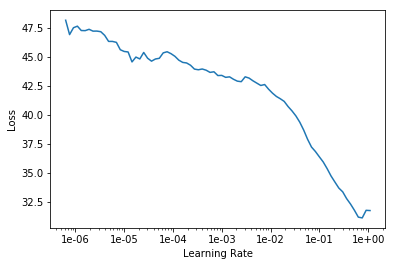

In [0]:
learn.lr_find(); learn.recorder.plot()

In [0]:
lr = 1e-02

In [0]:
learn.fit_one_cycle(5, slice(lr))

epoch,train_loss,valid_loss,mean_absolute_error,time
0,34.317429,32.307457,4.808015,00:00
1,15.358010,7.295526,2.163040,00:00
2,9.773008,7.050543,2.062063,00:00
3,8.053606,7.600991,2.178780,00:00
4,7.342613,7.226801,2.124645,00:00


In [0]:
learn.fit_one_cycle(5, slice(lr), callbacks=[SaveModelCallback(learn, mode='min', every='improvement', monitor='mean_absolute_error', name='best')])

epoch,train_loss,valid_loss,mean_absolute_error,time
0,6.822850,7.672492,2.193687,00:00
1,7.321067,6.620657,2.006394,00:00
2,7.189791,6.871299,2.032751,00:00
3,7.112051,7.284886,2.132744,00:00
4,6.911522,7.148203,2.102537,00:00


Better model found at epoch 0 with mean_absolute_error value: 2.1936874389648438.
Better model found at epoch 1 with mean_absolute_error value: 2.006394147872925.


In [0]:
learn.save('stage-1')

In [0]:
learn.load('stage-1');

In [0]:
learn.load('stage-1');

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


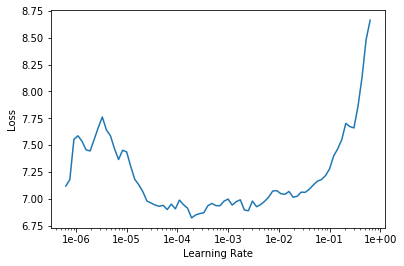

In [0]:
learn.lr_find(); learn.recorder.plot()

In [0]:
learn.fit_one_cycle(5,slice(1e-05), callbacks=[SaveModelCallback(learn, every='improvement', mode='min', monitor='mean_absolute_error', name='best')])

epoch,train_loss,valid_loss,mean_absolute_error,time
0,7.209520,7.075804,2.120301,00:00
1,7.069476,7.081394,2.118587,00:00
2,7.061285,7.301764,2.154299,00:00
3,7.076095,7.299461,2.144863,00:00
4,7.076307,7.386985,2.159657,00:00


Better model found at epoch 0 with mean_absolute_error value: 2.1203012466430664.
Better model found at epoch 1 with mean_absolute_error value: 2.118587017059326.


In [0]:
!ls ~ -alh

total 80K
drwx------ 1 root root 4.0K Apr 24 07:21 .
drwxr-xr-x 1 root root 4.0K Apr 24 06:46 ..
-rw-r--r-- 1 root root 3.1K Apr  9  2018 .bashrc
drwx------ 1 root root 4.0K Apr 24 06:47 .cache
drwx------ 4 root root 4.0K Apr 22 16:42 .config
drwxr-xr-x 3 root root 4.0K Apr 24 06:47 .fastai
drwxr-xr-x 4 root root 4.0K Apr 24 06:46 .forever
drwxr-xr-x 3 root root 4.0K Apr 22 16:08 .gsutil
drwxr-xr-x 1 root root 4.0K Apr 22 16:40 .ipython
drwx------ 2 root root 4.0K Apr 22 16:41 .jupyter
drwxr-xr-x 2 root root 4.0K Apr 24 06:47 .keras
drwx------ 1 root root 4.0K Apr 22 16:41 .local
drwxr-xr-x 3 root root 4.0K Apr 22 16:41 .node-gyp
drwxr-xr-x 4 root root 4.0K Apr 22 16:41 .npm
drwx------ 3 root root 4.0K Apr 24 07:21 .nv
-rw-r--r-- 1 root root  148 Aug 17  2015 .profile
drwxr-xr-x 3 root root 4.0K Apr 24 06:47 .torch


In [0]:
learn.load('best')

Learner(data=TabularDataBunch;

Train: LabelList (3394 items)
x: TabularList
Rstd__last_5000 -0.0484; max_roll_mean_1000 0.1237; abs_max_roll_mean_100 -0.0732; MA_400MA_BB_low_mean 0.2980; q05_roll_std_100 0.1313; q001 0.1680; min_first_10000 0.2197; av_change_abs_roll_std_10 -0.0078; av_change_rate_roll_std_100 -0.0601; av_change_rate_roll_mean_100 -0.0381; max_first_50000 -0.0293; std_roll_std_1000 -0.1879; Moving_average_1500_mean 1.8806; q01_roll_mean_10 0.2444; abs_q05 0.2814; abs_max_roll_mean_1000 0.1237; Rmean_last_5000 -0.6464; Hann_window_mean 1.8773; abs_max_roll_std_1000 -0.1670; q05_roll_mean_10 0.4679; abs_max_roll_std_10 -0.3067; q01_roll_mean_1000 1.1864; max_last_10000 -0.1295; Rmax 1.8773; q95_roll_std_100 -0.2474; iqr -0.9580; ave_roll_std_10 -0.1933; abs_q95 -0.0182; max -0.2409; Moving_average_6000_mean 1.9014; max_roll_mean_10 -0.1426; classic_sta_lta2_mean -0.0879; abs_q99 -0.1597; Moving_average_3000_mean 1.8882; q99_roll_mean_1000 0.9491; exp_Moving_average_300

In [0]:
preds, _ = learn.get_preds(ds_type=DatasetType.Test)

In [0]:
for c in test_df.columns: print(c)
  

In [0]:
 for c in test_df.index.names:
    print(c)

seg_id


In [0]:
test_df.reset_index(level=0, inplace=True)  #Convert index to Column

In [0]:
subm_df = pd.DataFrame(test_df['seg_id'])

In [0]:
test_df

In [0]:
subm_df["time_to_failure"] = preds.numpy()

In [0]:
subm_df.head()

,seg_id,time_to_failure
0,seg_00030f,3.030323
1,seg_0012b5,5.492407
2,seg_00184e,5.581075
3,seg_003339,7.984946
4,seg_0042cc,6.815203


In [0]:
subm_df.to_csv('submission.csv', index=False)

###Google Drive Connect

In [0]:
from google.colab import drive
drive.mount('/content/whale')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/whale


In [0]:
!ls -l 'whale/My Drive/'

total 194919
drwx------ 2 root root      4096 Sep  8  2018 'Colab Notebooks'
-rw------- 1 root root     76524 Apr 26 13:22  submission_2Lan1.csv
drwx------ 2 root root      4096 Jan 13 10:50  whale
-rw------- 1 root root   7950997 Apr 26 13:22  X_submit.csv
-rw------- 1 root root 190037461 Apr 26 13:22  X_train.csv
-rw------- 1 root root   1522463 Apr 26 13:22  y_train_raw.csv


In [0]:
#code to move file to Drive

!cp *.csv 'whale/My Drive'

In [0]:
!cp 'whale/My Drive/X_train.csv' .

In [0]:
!cp 'whale/My Drive/y_train_raw.csv' .

###Load Data CSVs for LGBM

In [0]:
X_train = pd.read_csv('X_train.csv', dtype = np.float64)

In [0]:
X_train.dtypes

Unnamed: 0           float64
ave                  float64
std                  float64
max                  float64
min                  float64
dave                 float64
dstd                 float64
dmax                 float64
dmin                 float64
q01                  float64
q02                  float64
q03                  float64
q04                  float64
q05                  float64
q06                  float64
q07                  float64
q08                  float64
q09                  float64
q10                  float64
q90                  float64
q91                  float64
q92                  float64
q93                  float64
q94                  float64
q95                  float64
q96                  float64
q97                  float64
q98                  float64
q99                  float64
dq01                 float64
                      ...   
q90_roll_ave_100     float64
q91_roll_ave_100     float64
q92_roll_ave_100     float64
q93_roll_ave_1

In [0]:
#X_submit = pd.read_csv('X_submit.csv')

In [0]:
#X_submit.shape

(2624, 270)

In [0]:
y_train_raw = pd.read_csv('y_train_raw.csv', usecols=['time_to_failure'])

In [0]:
y_train_raw.shape

(62910, 1)

In [0]:
column = y_train_raw.columns

In [0]:
column

Index(['time_to_failure'], dtype='object')

In [0]:
del X_train, X_submit, y_train_raw

In [0]:
gc.collect()

69

In [0]:
X_train.columns

Index(['Unnamed: 0', 'ave', 'std', 'max', 'min', 'dave', 'dstd', 'dmax',
       'dmin', 'q01',
       ...
       'q90_roll_ave_1000', 'q91_roll_ave_1000', 'q92_roll_ave_1000',
       'q93_roll_ave_1000', 'q94_roll_ave_1000', 'q95_roll_ave_1000',
       'q96_roll_ave_1000', 'q97_roll_ave_1000', 'q98_roll_ave_1000',
       'q99_roll_ave_1000'],
      dtype='object', length=270)

In [0]:
X_submit = pd.read_csv('X_submit.csv')

In [0]:
X_submit.columns

Index(['ave', 'std', 'max', 'min', 'dave', 'dstd', 'dmax', 'dmin', 'q01',
       'q02',
       ...
       'q90_roll_ave_1000', 'q91_roll_ave_1000', 'q92_roll_ave_1000',
       'q93_roll_ave_1000', 'q94_roll_ave_1000', 'q95_roll_ave_1000',
       'q96_roll_ave_1000', 'q97_roll_ave_1000', 'q98_roll_ave_1000',
       'q99_roll_ave_1000'],
      dtype='object', length=269)

In [0]:
y_train_raw.columns

Index(['time_to_failure'], dtype='object')

###LightGBM https://www.kaggle.com/johnjarmitage/forest-regression-using-lightgbm

In [0]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm

from scipy.signal import butter, lfilter
from scipy.stats import kurtosis
from scipy.stats import skew

%matplotlib inline

In [0]:
import lightgbm as lgb
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV

In [0]:
rows = 150_000
n_rows = 100*rows

In [0]:
rows = 150000
rowjump = 10000
njumps = int(15)


In [0]:
segments = int(np.floor(train_df.shape[0] / rows))

In [0]:
segments = 4194

In [0]:
X_train = pd.DataFrame(index=range(segments), dtype=np.float64,
                       columns=['ave', 'std', 'max', 'min',
                                'dave', 'dstd', 'dmax', 'dmin',
                                'q01', 'q02', 'q03', 'q04', 'q05', 'q06', 'q07', 'q08', 'q09', 'q10',
                                'q90', 'q91', 'q92', 'q93', 'q94', 'q95', 'q96', 'q97', 'q98', 'q99',
                                'dq01', 'dq02', 'dq03', 'dq04', 'dq05', 'dq06', 'dq07', 'dq08', 'dq09', 'dq10',
                                'dq90', 'dq91', 'dq92', 'dq93', 'dq94', 'dq95', 'dq96', 'dq97', 'dq98', 'dq99',
                                'kurt', 'skew',
                                'dkurt', 'dskew',
                                'ave_roll_std_10', 'std_roll_std_10', 'max_roll_std_10', 'min_roll_std_10',
                                'ave_roll_ave_10', 'std_roll_ave_10', 'max_roll_ave_10', 'min_roll_ave_10',
                                'ave_roll_std_100', 'std_roll_std_100', 'max_roll_std_100', 'min_roll_std_100',
                                'ave_roll_ave_100', 'std_roll_ave_100', 'max_roll_ave_100', 'min_roll_ave_100',
                                'ave_roll_std_1000', 'std_roll_std_1000', 'max_roll_std_1000', 'min_roll_std_1000',
                                'ave_roll_ave_1000', 'std_roll_ave_1000', 'max_roll_ave_1000', 'min_roll_ave_1000',
                                'ave_roll_ave_10', 'std_roll_ave_10', 'max_roll_ave_10', 'min_roll_ave_10',
                                'ave_roll_std_100', 'std_roll_std_100', 'max_roll_std_100', 'min_roll_std_100',
                                'ave_roll_ave_100', 'std_roll_ave_100', 'max_roll_ave_100', 'min_roll_ave_100',
                                'ave_roll_std_1000', 'std_roll_std_1000', 'max_roll_std_1000', 'min_roll_std_1000',
                                'ave_roll_ave_1000', 'std_roll_ave_1000', 'max_roll_ave_1000', 'min_roll_ave_1000',
                                'q01_roll_std_10', 'q02_roll_std_10', 'q03_roll_std_10', 'q04_roll_std_10',
                                'q05_roll_std_10', 'q06_roll_std_10', 'q07_roll_std_10', 'q08_roll_std_10',
                                'q09_roll_std_10', 'q10_roll_std_10',
                                'q90_roll_std_10', 'q91_roll_std_10', 'q92_roll_std_10', 'q93_roll_std_10',
                                'q94_roll_std_10', 'q95_roll_std_10', 'q96_roll_std_10', 'q97_roll_std_10',
                                'q98_roll_std_10', 'q99_roll_std_10',
                                'q01_roll_std_100', 'q02_roll_std_100', 'q03_roll_std_100', 'q04_roll_std_100',
                                'q05_roll_std_100', 'q06_roll_std_100', 'q07_roll_std_100', 'q08_roll_std_100',
                                'q09_roll_std_100', 'q10_roll_std_100',
                                'q90_roll_std_100', 'q91_roll_std_100', 'q92_roll_std_100', 'q93_roll_std_100',
                                'q94_roll_std_100', 'q95_roll_std_100', 'q96_roll_std_100', 'q97_roll_std_100',
                                'q98_roll_std_100', 'q99_roll_std_100',
                                'q01_roll_std_1000', 'q02_roll_std_1000', 'q03_roll_std_1000', 'q04_roll_std_1000',
                                'q05_roll_std_1000', 'q06_roll_std_1000', 'q07_roll_std_1000', 'q08_roll_std_1000',
                                'q09_roll_std_1000', 'q10_roll_std_1000',
                                'q90_roll_std_1000', 'q91_roll_std_1000', 'q92_roll_std_1000', 'q93_roll_std_1000',
                                'q94_roll_std_1000', 'q95_roll_std_1000', 'q96_roll_std_1000', 'q97_roll_std_1000',
                                'q98_roll_std_1000', 'q99_roll_std_1000',
                                'av_change_abs_roll_std_10', 'av_change_rate_roll_std_10',
                                'av_change_abs_roll_ave_10', 'av_change_rate_roll_ave_10',
                                'av_change_abs_roll_std_100', 'av_change_rate_roll_std_100',
                                'av_change_abs_roll_ave_100', 'av_change_rate_roll_ave_100',
                                'av_change_abs_roll_std_1000', 'av_change_rate_roll_std_1000',
                                'av_change_abs_roll_ave_1000', 'av_change_rate_roll_ave_1000',
                                'sum',
                                'tq01', 'tq02', 'tq03', 'tq04', 'tq05', 'tq06', 'tq07', 'tq08', 'tq09', 'tq10',
                                'tq90', 'tq91', 'tq92', 'tq93', 'tq94', 'tq95', 'tq96', 'tq97', 'tq98', 'tq99',
                                'dtq01', 'dtq02', 'dtq03', 'dtq04', 'dtq05', 'dtq06', 'dtq07', 'dtq08', 'dtq09', 'dtq10',
                                'dtq90', 'dtq91', 'dtq92', 'dtq93', 'dtq94', 'dtq95', 'dtq96', 'dtq97', 'dtq98', 'dtq99'])
y_train_raw = pd.DataFrame(index=range(segments), dtype=np.float64,
                       columns=['time_to_failure'])

In [0]:
for njump in range(njumps) :
    for segment in tqdm(range(segments)):
        
        seg = train_df.iloc[segment*rows+njump*rowjump:segment*rows+rows+njump*rowjump]
        x_raw = seg['acoustic_data']
        x = seg['acoustic_data'].values
        dx = np.diff(x)
        y = seg['time_to_failure'].values[-1]
    
        y_train_raw.loc[segment+njump*segments, 'time_to_failure'] = y
    
        # simple features
    
        X_train.loc[segment+njump*segments, 'ave'] = x.mean()
        X_train.loc[segment+njump*segments, 'std'] = x.std()
        X_train.loc[segment+njump*segments, 'max'] = x.max()
        X_train.loc[segment+njump*segments, 'min'] = x.min()

        X_train.loc[segment+njump*segments, 'dave'] = dx.mean()
        X_train.loc[segment+njump*segments, 'dstd'] = dx.std()
        X_train.loc[segment+njump*segments, 'dmax'] = dx.max()
        X_train.loc[segment+njump*segments, 'dmin'] = dx.min()

        # quartiles

        X_train.loc[segment+njump*segments, 'q01'] = np.quantile(x,0.01)
        X_train.loc[segment+njump*segments, 'q02'] = np.quantile(x,0.02)
        X_train.loc[segment+njump*segments, 'q03'] = np.quantile(x,0.03)
        X_train.loc[segment+njump*segments, 'q04'] = np.quantile(x,0.04)
        X_train.loc[segment+njump*segments, 'q05'] = np.quantile(x,0.05)
        X_train.loc[segment+njump*segments, 'q06'] = np.quantile(x,0.06)
        X_train.loc[segment+njump*segments, 'q07'] = np.quantile(x,0.07)
        X_train.loc[segment+njump*segments, 'q08'] = np.quantile(x,0.08)
        X_train.loc[segment+njump*segments, 'q09'] = np.quantile(x,0.09)
        X_train.loc[segment+njump*segments, 'q10'] = np.quantile(x,0.10)
        X_train.loc[segment+njump*segments, 'q90'] = np.quantile(x,0.90)
        X_train.loc[segment+njump*segments, 'q91'] = np.quantile(x,0.91)
        X_train.loc[segment+njump*segments, 'q92'] = np.quantile(x,0.92)
        X_train.loc[segment+njump*segments, 'q93'] = np.quantile(x,0.93)
        X_train.loc[segment+njump*segments, 'q94'] = np.quantile(x,0.94)
        X_train.loc[segment+njump*segments, 'q95'] = np.quantile(x,0.95)
        X_train.loc[segment+njump*segments, 'q96'] = np.quantile(x,0.96)
        X_train.loc[segment+njump*segments, 'q97'] = np.quantile(x,0.97)
        X_train.loc[segment+njump*segments, 'q98'] = np.quantile(x,0.98)
        X_train.loc[segment+njump*segments, 'q99'] = np.quantile(x,0.99)

        X_train.loc[segment+njump*segments, 'dq01'] = np.quantile(dx,0.01)
        X_train.loc[segment+njump*segments, 'dq02'] = np.quantile(dx,0.02)
        X_train.loc[segment+njump*segments, 'dq03'] = np.quantile(dx,0.03)
        X_train.loc[segment+njump*segments, 'dq04'] = np.quantile(dx,0.04)
        X_train.loc[segment+njump*segments, 'dq05'] = np.quantile(dx,0.05)
        X_train.loc[segment+njump*segments, 'dq06'] = np.quantile(dx,0.06)
        X_train.loc[segment+njump*segments, 'dq07'] = np.quantile(dx,0.07)
        X_train.loc[segment+njump*segments, 'dq08'] = np.quantile(dx,0.08)
        X_train.loc[segment+njump*segments, 'dq09'] = np.quantile(dx,0.09)
        X_train.loc[segment+njump*segments, 'dq10'] = np.quantile(dx,0.10)
        X_train.loc[segment+njump*segments, 'dq90'] = np.quantile(dx,0.90)
        X_train.loc[segment+njump*segments, 'dq91'] = np.quantile(dx,0.91)
        X_train.loc[segment+njump*segments, 'dq92'] = np.quantile(dx,0.92)
        X_train.loc[segment+njump*segments, 'dq93'] = np.quantile(dx,0.93)
        X_train.loc[segment+njump*segments, 'dq94'] = np.quantile(dx,0.94)
        X_train.loc[segment+njump*segments, 'dq95'] = np.quantile(dx,0.95)
        X_train.loc[segment+njump*segments, 'dq96'] = np.quantile(dx,0.96)
        X_train.loc[segment+njump*segments, 'dq97'] = np.quantile(dx,0.97)
        X_train.loc[segment+njump*segments, 'dq98'] = np.quantile(dx,0.98)
        X_train.loc[segment+njump*segments, 'dq99'] = np.quantile(dx,0.99)
        # extras

        X_train.loc[segment+njump*segments, 'kurt'] = kurtosis(x)
        X_train.loc[segment+njump*segments, 'skew'] = skew(x)

        X_train.loc[segment+njump*segments, 'dkurt'] = kurtosis(dx)
        X_train.loc[segment+njump*segments, 'dskew'] = skew(dx)

        # rolling mean, std, quantiles

        for windows in [10,100,1000]:
            x_roll_std = x_raw.rolling(windows).std().dropna().values
            x_roll_mean = x_raw.rolling(windows).mean().dropna().values

            X_train.loc[segment+njump*segments, 'ave_roll_std_' + str(windows)] = x_roll_std.mean()
            X_train.loc[segment+njump*segments, 'std_roll_std_' + str(windows)] = x_roll_std.std()
            X_train.loc[segment+njump*segments, 'max_roll_std_' + str(windows)] = x_roll_std.max()
            X_train.loc[segment+njump*segments, 'min_roll_std_' + str(windows)] = x_roll_std.min()

            X_train.loc[segment+njump*segments, 'ave_roll_ave_' + str(windows)] = x_roll_mean.mean()
            X_train.loc[segment+njump*segments, 'std_roll_ave_' + str(windows)] = x_roll_mean.std()
            X_train.loc[segment+njump*segments, 'max_roll_ave_' + str(windows)] = x_roll_mean.max()
            X_train.loc[segment+njump*segments, 'min_roll_ave_' + str(windows)] = x_roll_mean.min()

            X_train.loc[segment+njump*segments, 'q01_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.01)
            X_train.loc[segment+njump*segments, 'q02_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.02)
            X_train.loc[segment+njump*segments, 'q03_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.03)
            X_train.loc[segment+njump*segments, 'q04_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.04)
            X_train.loc[segment+njump*segments, 'q05_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.05)
            X_train.loc[segment+njump*segments, 'q06_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.06)
            X_train.loc[segment+njump*segments, 'q07_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.07)
            X_train.loc[segment+njump*segments, 'q08_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.08)
            X_train.loc[segment+njump*segments, 'q09_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.09)
            X_train.loc[segment+njump*segments, 'q10_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.10)
            X_train.loc[segment+njump*segments, 'q90_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.90)
            X_train.loc[segment+njump*segments, 'q91_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.91)
            X_train.loc[segment+njump*segments, 'q92_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.92)
            X_train.loc[segment+njump*segments, 'q93_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.93)
            X_train.loc[segment+njump*segments, 'q94_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.94)
            X_train.loc[segment+njump*segments, 'q95_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.95)
            X_train.loc[segment+njump*segments, 'q96_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.96)
            X_train.loc[segment+njump*segments, 'q97_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.97)
            X_train.loc[segment+njump*segments, 'q98_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.98)
            X_train.loc[segment+njump*segments, 'q99_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.99)

            X_train.loc[segment+njump*segments, 'q01_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.01)
            X_train.loc[segment+njump*segments, 'q02_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.02)
            X_train.loc[segment+njump*segments, 'q03_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.03)
            X_train.loc[segment+njump*segments, 'q04_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.04)
            X_train.loc[segment+njump*segments, 'q05_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.05)
            X_train.loc[segment+njump*segments, 'q06_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.06)
            X_train.loc[segment+njump*segments, 'q07_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.07)
            X_train.loc[segment+njump*segments, 'q08_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.08)
            X_train.loc[segment+njump*segments, 'q09_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.09)
            X_train.loc[segment+njump*segments, 'q10_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.10)
            X_train.loc[segment+njump*segments, 'q90_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.90)
            X_train.loc[segment+njump*segments, 'q91_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.91)
            X_train.loc[segment+njump*segments, 'q92_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.92)
            X_train.loc[segment+njump*segments, 'q93_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.93)
            X_train.loc[segment+njump*segments, 'q94_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.94)
            X_train.loc[segment+njump*segments, 'q95_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.95)
            X_train.loc[segment+njump*segments, 'q96_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.96)
            X_train.loc[segment+njump*segments, 'q97_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.97)
            X_train.loc[segment+njump*segments, 'q98_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.98)
            X_train.loc[segment+njump*segments, 'q99_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.99)

            X_train.loc[segment+njump*segments, 'av_change_abs_roll_std_' + str(windows)] = np.mean(np.diff(x_roll_std))
            X_train.loc[segment+njump*segments, 'av_change_rate_roll_std_' + str(windows)] = np.mean(np.nonzero((np.diff(x_roll_std) / x_roll_std[:-1]))[0])

            X_train.loc[segment+njump*segments, 'av_change_abs_roll_ave_' + str(windows)] = np.mean(np.diff(x_roll_mean))
            X_train.loc[segment+njump*segments, 'av_change_rate_roll_ave_' + str(windows)] = np.mean(np.nonzero((np.diff(x_roll_mean) / x_roll_mean[:-1]))[0])

        # accumulated energy

        X_train.loc[segment+njump*segments, 'sum'] = sum(abs(x))

        # threshold

        X_train.loc[segment+njump*segments, 'tq01'] = np.count_nonzero(x < np.quantile(x,0.01))
        X_train.loc[segment+njump*segments, 'tq02'] = np.count_nonzero(x < np.quantile(x,0.02))
        X_train.loc[segment+njump*segments, 'tq03'] = np.count_nonzero(x > np.quantile(x,0.03))
        X_train.loc[segment+njump*segments, 'tq04'] = np.count_nonzero(x > np.quantile(x,0.04))
        X_train.loc[segment+njump*segments, 'tq05'] = np.count_nonzero(x < np.quantile(x,0.05))
        X_train.loc[segment+njump*segments, 'tq06'] = np.count_nonzero(x < np.quantile(x,0.06))
        X_train.loc[segment+njump*segments, 'tq07'] = np.count_nonzero(x > np.quantile(x,0.07))
        X_train.loc[segment+njump*segments, 'tq08'] = np.count_nonzero(x > np.quantile(x,0.08))
        X_train.loc[segment+njump*segments, 'tq09'] = np.count_nonzero(x < np.quantile(x,0.09))
        X_train.loc[segment+njump*segments, 'tq10'] = np.count_nonzero(x < np.quantile(x,0.10))
        X_train.loc[segment+njump*segments, 'tq90'] = np.count_nonzero(x < np.quantile(x,0.90))
        X_train.loc[segment+njump*segments, 'tq91'] = np.count_nonzero(x > np.quantile(x,0.91))
        X_train.loc[segment+njump*segments, 'tq92'] = np.count_nonzero(x > np.quantile(x,0.92))
        X_train.loc[segment+njump*segments, 'tq93'] = np.count_nonzero(x < np.quantile(x,0.93))
        X_train.loc[segment+njump*segments, 'tq94'] = np.count_nonzero(x < np.quantile(x,0.94))
        X_train.loc[segment+njump*segments, 'tq95'] = np.count_nonzero(x > np.quantile(x,0.95))
        X_train.loc[segment+njump*segments, 'tq96'] = np.count_nonzero(x > np.quantile(x,0.96))
        X_train.loc[segment+njump*segments, 'tq97'] = np.count_nonzero(x < np.quantile(x,0.97))
        X_train.loc[segment+njump*segments, 'tq98'] = np.count_nonzero(x < np.quantile(x,0.98))
        X_train.loc[segment+njump*segments, 'tq99'] = np.count_nonzero(x > np.quantile(x,0.99))

        X_train.loc[segment+njump*segments, 'dtq01'] = np.count_nonzero(x < np.quantile(dx,0.01))
        X_train.loc[segment+njump*segments, 'dtq02'] = np.count_nonzero(x < np.quantile(dx,0.02))
        X_train.loc[segment+njump*segments, 'dtq03'] = np.count_nonzero(x > np.quantile(dx,0.03))
        X_train.loc[segment+njump*segments, 'dtq04'] = np.count_nonzero(x > np.quantile(dx,0.04))
        X_train.loc[segment+njump*segments, 'dtq05'] = np.count_nonzero(x < np.quantile(dx,0.05))
        X_train.loc[segment+njump*segments, 'dtq06'] = np.count_nonzero(x < np.quantile(dx,0.06))
        X_train.loc[segment+njump*segments, 'dtq07'] = np.count_nonzero(x > np.quantile(dx,0.07))
        X_train.loc[segment+njump*segments, 'dtq08'] = np.count_nonzero(x > np.quantile(dx,0.08))
        X_train.loc[segment+njump*segments, 'dtq09'] = np.count_nonzero(x < np.quantile(dx,0.09))
        X_train.loc[segment+njump*segments, 'dtq10'] = np.count_nonzero(x < np.quantile(dx,0.10))
        X_train.loc[segment+njump*segments, 'dtq90'] = np.count_nonzero(x < np.quantile(dx,0.90))
        X_train.loc[segment+njump*segments, 'dtq91'] = np.count_nonzero(x > np.quantile(dx,0.91))
        X_train.loc[segment+njump*segments, 'dtq92'] = np.count_nonzero(x > np.quantile(dx,0.92))
        X_train.loc[segment+njump*segments, 'dtq93'] = np.count_nonzero(x < np.quantile(dx,0.93))
        X_train.loc[segment+njump*segments, 'dtq94'] = np.count_nonzero(x < np.quantile(dx,0.94))
        X_train.loc[segment+njump*segments, 'dtq95'] = np.count_nonzero(x > np.quantile(dx,0.95))
        X_train.loc[segment+njump*segments, 'dtq96'] = np.count_nonzero(x > np.quantile(dx,0.96))
        X_train.loc[segment+njump*segments, 'dtq97'] = np.count_nonzero(x < np.quantile(dx,0.97))
        X_train.loc[segment+njump*segments, 'dtq98'] = np.count_nonzero(x < np.quantile(dx,0.98))
        X_train.loc[segment+njump*segments, 'dtq99'] = np.count_nonzero(x > np.quantile(dx,0.99))

In [0]:
X_train.dtypes

In [0]:
X_submit.dtypes

In [0]:
X_train.columns

Index(['ave', 'std', 'max', 'min', 'dave', 'dstd', 'dmax', 'dmin', 'q01',
       'q02',
       ...
       'q90_roll_ave_1000', 'q91_roll_ave_1000', 'q92_roll_ave_1000',
       'q93_roll_ave_1000', 'q94_roll_ave_1000', 'q95_roll_ave_1000',
       'q96_roll_ave_1000', 'q97_roll_ave_1000', 'q98_roll_ave_1000',
       'q99_roll_ave_1000'],
      dtype='object', length=269)

In [0]:
%%time
# Save into feather format
X_train.to_csv(r'X_train.csv')

CPU times: user 18.2 s, sys: 580 ms, total: 18.8 s
Wall time: 18.9 s


In [0]:
submission = pd.read_csv('data/lanl/sample_submission.csv', index_col='seg_id')
X_submit = pd.DataFrame(index=submission.index, dtype=np.float64, columns=X_train.columns)

for i, seg_id in enumerate(tqdm(X_submit.index)):
    seg = pd.read_csv('data/lanl/test/' + seg_id + '.csv')
    x_raw = seg['acoustic_data']
    x = seg['acoustic_data'].values
    dx = np.diff(x)
    
    # simple features
    
    X_submit.loc[seg_id, 'ave'] = x.mean()
    X_submit.loc[seg_id, 'std'] = x.std()
    X_submit.loc[seg_id, 'max'] = x.max()
    X_submit.loc[seg_id, 'min'] = x.min()
        
    X_submit.loc[seg_id, 'dave'] = dx.mean()
    X_submit.loc[seg_id, 'dstd'] = dx.std()
    X_submit.loc[seg_id, 'dmax'] = dx.max()
    X_submit.loc[seg_id, 'dmin'] = dx.min()
     
    # quartiles
    
    X_submit.loc[seg_id, 'q01'] = np.quantile(x,0.01)
    X_submit.loc[seg_id, 'q02'] = np.quantile(x,0.02)
    X_submit.loc[seg_id, 'q03'] = np.quantile(x,0.03)
    X_submit.loc[seg_id, 'q04'] = np.quantile(x,0.04)
    X_submit.loc[seg_id, 'q05'] = np.quantile(x,0.05)
    X_submit.loc[seg_id, 'q06'] = np.quantile(x,0.06)
    X_submit.loc[seg_id, 'q07'] = np.quantile(x,0.07)
    X_submit.loc[seg_id, 'q08'] = np.quantile(x,0.08)
    X_submit.loc[seg_id, 'q09'] = np.quantile(x,0.09)
    X_submit.loc[seg_id, 'q10'] = np.quantile(x,0.10)
    X_submit.loc[seg_id, 'q90'] = np.quantile(x,0.90)
    X_submit.loc[seg_id, 'q91'] = np.quantile(x,0.91)
    X_submit.loc[seg_id, 'q92'] = np.quantile(x,0.92)
    X_submit.loc[seg_id, 'q93'] = np.quantile(x,0.93)
    X_submit.loc[seg_id, 'q94'] = np.quantile(x,0.94)
    X_submit.loc[seg_id, 'q95'] = np.quantile(x,0.95)
    X_submit.loc[seg_id, 'q96'] = np.quantile(x,0.96)
    X_submit.loc[seg_id, 'q97'] = np.quantile(x,0.97)
    X_submit.loc[seg_id, 'q98'] = np.quantile(x,0.98)
    X_submit.loc[seg_id, 'q99'] = np.quantile(x,0.99)
        
    X_submit.loc[seg_id, 'dq01'] = np.quantile(dx,0.01)
    X_submit.loc[seg_id, 'dq02'] = np.quantile(dx,0.02)
    X_submit.loc[seg_id, 'dq03'] = np.quantile(dx,0.03)
    X_submit.loc[seg_id, 'dq04'] = np.quantile(dx,0.04)
    X_submit.loc[seg_id, 'dq05'] = np.quantile(dx,0.05)
    X_submit.loc[seg_id, 'dq06'] = np.quantile(dx,0.06)
    X_submit.loc[seg_id, 'dq07'] = np.quantile(dx,0.07)
    X_submit.loc[seg_id, 'dq08'] = np.quantile(dx,0.08)
    X_submit.loc[seg_id, 'dq09'] = np.quantile(dx,0.09)
    X_submit.loc[seg_id, 'dq10'] = np.quantile(dx,0.10)
    X_submit.loc[seg_id, 'dq90'] = np.quantile(dx,0.90)
    X_submit.loc[seg_id, 'dq91'] = np.quantile(dx,0.91)
    X_submit.loc[seg_id, 'dq92'] = np.quantile(dx,0.92)
    X_submit.loc[seg_id, 'dq93'] = np.quantile(dx,0.93)
    X_submit.loc[seg_id, 'dq94'] = np.quantile(dx,0.94)
    X_submit.loc[seg_id, 'dq95'] = np.quantile(dx,0.95)
    X_submit.loc[seg_id, 'dq96'] = np.quantile(dx,0.96)
    X_submit.loc[seg_id, 'dq97'] = np.quantile(dx,0.97)
    X_submit.loc[seg_id, 'dq98'] = np.quantile(dx,0.98)
    X_submit.loc[seg_id, 'dq99'] = np.quantile(dx,0.99)
    
    # extras
    
    X_submit.loc[seg_id, 'kurt'] = kurtosis(x)
    X_submit.loc[seg_id, 'skew'] = skew(x)
    
    X_submit.loc[seg_id, 'dkurt'] = kurtosis(dx)
    X_submit.loc[seg_id, 'dskew'] = skew(dx)
    
    # rolling mean and std
    
    for windows in [10,100,1000]:
        x_roll_std = x_raw.rolling(windows).std().dropna().values
        x_roll_mean = x_raw.rolling(windows).mean().dropna().values
        
        X_submit.loc[seg_id, 'ave_roll_std_' + str(windows)] = x_roll_std.mean()
        X_submit.loc[seg_id, 'std_roll_std_' + str(windows)] = x_roll_std.std()
        X_submit.loc[seg_id, 'max_roll_std_' + str(windows)] = x_roll_std.max()
        X_submit.loc[seg_id, 'min_roll_std_' + str(windows)] = x_roll_std.min()
        
        X_submit.loc[seg_id, 'ave_roll_ave_' + str(windows)] = x_roll_mean.mean()
        X_submit.loc[seg_id, 'std_roll_ave_' + str(windows)] = x_roll_mean.std()
        X_submit.loc[seg_id, 'max_roll_ave_' + str(windows)] = x_roll_mean.max()
        X_submit.loc[seg_id, 'min_roll_ave_' + str(windows)] = x_roll_mean.min()
        
        X_submit.loc[seg_id, 'q01_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.01)
        X_submit.loc[seg_id, 'q02_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.02)
        X_submit.loc[seg_id, 'q03_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.03)
        X_submit.loc[seg_id, 'q04_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.04)
        X_submit.loc[seg_id, 'q05_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.05)
        X_submit.loc[seg_id, 'q06_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.06)
        X_submit.loc[seg_id, 'q07_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.07)
        X_submit.loc[seg_id, 'q08_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.08)
        X_submit.loc[seg_id, 'q09_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.09)
        X_submit.loc[seg_id, 'q10_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.10)
        X_submit.loc[seg_id, 'q90_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.90)
        X_submit.loc[seg_id, 'q91_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.91)
        X_submit.loc[seg_id, 'q92_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.92)
        X_submit.loc[seg_id, 'q93_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.93)
        X_submit.loc[seg_id, 'q94_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.94)
        X_submit.loc[seg_id, 'q95_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.95)
        X_submit.loc[seg_id, 'q96_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.96)
        X_submit.loc[seg_id, 'q97_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.97)
        X_submit.loc[seg_id, 'q98_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.98)
        X_submit.loc[seg_id, 'q99_roll_std_' + str(windows)] = np.quantile(x_roll_std,0.99)
        
        X_submit.loc[seg_id, 'q01_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.01)
        X_submit.loc[seg_id, 'q02_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.02)
        X_submit.loc[seg_id, 'q03_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.03)
        X_submit.loc[seg_id, 'q04_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.04)
        X_submit.loc[seg_id, 'q05_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.05)
        X_submit.loc[seg_id, 'q06_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.06)
        X_submit.loc[seg_id, 'q07_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.07)
        X_submit.loc[seg_id, 'q08_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.08)
        X_submit.loc[seg_id, 'q09_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.09)
        X_submit.loc[seg_id, 'q10_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.10)
        X_submit.loc[seg_id, 'q90_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.90)
        X_submit.loc[seg_id, 'q91_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.91)
        X_submit.loc[seg_id, 'q92_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.92)
        X_submit.loc[seg_id, 'q93_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.93)
        X_submit.loc[seg_id, 'q94_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.94)
        X_submit.loc[seg_id, 'q95_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.95)
        X_submit.loc[seg_id, 'q96_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.96)
        X_submit.loc[seg_id, 'q97_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.97)
        X_submit.loc[seg_id, 'q98_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.98)
        X_submit.loc[seg_id, 'q99_roll_ave_' + str(windows)] = np.quantile(x_roll_mean,0.99)
        
        X_submit.loc[seg_id, 'av_change_abs_roll_std_' + str(windows)] = np.mean(np.diff(x_roll_std))
        X_submit.loc[seg_id, 'av_change_rate_roll_std_' + str(windows)] = np.mean(np.nonzero((np.diff(x_roll_std) / x_roll_std[:-1]))[0])
        
        X_submit.loc[seg_id, 'av_change_abs_roll_ave_' + str(windows)] = np.mean(np.diff(x_roll_mean))
        X_submit.loc[seg_id, 'av_change_rate_roll_ave_' + str(windows)] = np.mean(np.nonzero((np.diff(x_roll_mean) / x_roll_mean[:-1]))[0])
                
    # accumulated energy
    
    X_submit.loc[seg_id, 'sum'] = sum(abs(x))
    
    # threshold
    
    X_submit.loc[seg_id, 'tq01'] = np.count_nonzero(x < np.quantile(x,0.01))
    X_submit.loc[seg_id, 'tq02'] = np.count_nonzero(x < np.quantile(x,0.02))
    X_submit.loc[seg_id, 'tq03'] = np.count_nonzero(x > np.quantile(x,0.03))
    X_submit.loc[seg_id, 'tq04'] = np.count_nonzero(x > np.quantile(x,0.04))
    X_submit.loc[seg_id, 'tq05'] = np.count_nonzero(x < np.quantile(x,0.05))
    X_submit.loc[seg_id, 'tq06'] = np.count_nonzero(x < np.quantile(x,0.06))
    X_submit.loc[seg_id, 'tq07'] = np.count_nonzero(x > np.quantile(x,0.07))
    X_submit.loc[seg_id, 'tq08'] = np.count_nonzero(x > np.quantile(x,0.08))
    X_submit.loc[seg_id, 'tq09'] = np.count_nonzero(x < np.quantile(x,0.09))
    X_submit.loc[seg_id, 'tq10'] = np.count_nonzero(x < np.quantile(x,0.10))
    X_submit.loc[seg_id, 'tq90'] = np.count_nonzero(x < np.quantile(x,0.90))
    X_submit.loc[seg_id, 'tq91'] = np.count_nonzero(x > np.quantile(x,0.91))
    X_submit.loc[seg_id, 'tq92'] = np.count_nonzero(x > np.quantile(x,0.92))
    X_submit.loc[seg_id, 'tq93'] = np.count_nonzero(x < np.quantile(x,0.93))
    X_submit.loc[seg_id, 'tq94'] = np.count_nonzero(x < np.quantile(x,0.94))
    X_submit.loc[seg_id, 'tq95'] = np.count_nonzero(x > np.quantile(x,0.95))
    X_submit.loc[seg_id, 'tq96'] = np.count_nonzero(x > np.quantile(x,0.96))
    X_submit.loc[seg_id, 'tq97'] = np.count_nonzero(x < np.quantile(x,0.97))
    X_submit.loc[seg_id, 'tq98'] = np.count_nonzero(x < np.quantile(x,0.98))
    X_submit.loc[seg_id, 'tq99'] = np.count_nonzero(x > np.quantile(x,0.99))
    
    X_submit.loc[seg_id, 'dtq01'] = np.count_nonzero(x < np.quantile(dx,0.01))
    X_submit.loc[seg_id, 'dtq02'] = np.count_nonzero(x < np.quantile(dx,0.02))
    X_submit.loc[seg_id, 'dtq03'] = np.count_nonzero(x > np.quantile(dx,0.03))
    X_submit.loc[seg_id, 'dtq04'] = np.count_nonzero(x > np.quantile(dx,0.04))
    X_submit.loc[seg_id, 'dtq05'] = np.count_nonzero(x < np.quantile(dx,0.05))
    X_submit.loc[seg_id, 'dtq06'] = np.count_nonzero(x < np.quantile(dx,0.06))
    X_submit.loc[seg_id, 'dtq07'] = np.count_nonzero(x > np.quantile(dx,0.07))
    X_submit.loc[seg_id, 'dtq08'] = np.count_nonzero(x > np.quantile(dx,0.08))
    X_submit.loc[seg_id, 'dtq09'] = np.count_nonzero(x < np.quantile(dx,0.09))
    X_submit.loc[seg_id, 'dtq10'] = np.count_nonzero(x < np.quantile(dx,0.10))
    X_submit.loc[seg_id, 'dtq90'] = np.count_nonzero(x < np.quantile(dx,0.90))
    X_submit.loc[seg_id, 'dtq91'] = np.count_nonzero(x > np.quantile(dx,0.91))
    X_submit.loc[seg_id, 'dtq92'] = np.count_nonzero(x > np.quantile(dx,0.92))
    X_submit.loc[seg_id, 'dtq93'] = np.count_nonzero(x < np.quantile(dx,0.93))
    X_submit.loc[seg_id, 'dtq94'] = np.count_nonzero(x < np.quantile(dx,0.94))
    X_submit.loc[seg_id, 'dtq95'] = np.count_nonzero(x > np.quantile(dx,0.95))
    X_submit.loc[seg_id, 'dtq96'] = np.count_nonzero(x > np.quantile(dx,0.96))
    X_submit.loc[seg_id, 'dtq97'] = np.count_nonzero(x < np.quantile(dx,0.97))
    X_submit.loc[seg_id, 'dtq98'] = np.count_nonzero(x < np.quantile(dx,0.98))
    X_submit.loc[seg_id, 'dtq99'] = np.count_nonzero(x > np.quantile(dx,0.99))

  0%|          | 0/2624 [00:00<?, ?it/s]/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:136: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:136: RuntimeWarning: invalid value encountered in true_divide
 11%|█         | 287/2624 [01:57<15:39,  2.49it/s]/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:133: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:133: RuntimeWarning: invalid value encountered in true_divide
100%|██████████| 2624/2624 [17:44<00:00,  2.51it/s]


In [0]:
%%time
# Save y data to CSV format
y_train_raw.to_csv(r'y_train_raw.csv')


CPU times: user 147 ms, sys: 1.91 ms, total: 149 ms
Wall time: 149 ms


In [0]:
%%time
# Save into CSV format
X_submit.to_csv(r'X_submit.csv')

CPU times: user 758 ms, sys: 15.2 ms, total: 773 ms
Wall time: 774 ms


In [0]:
import multiprocessing
multiprocessing.cpu_count()

2

In [0]:
X_train.shape

(62910, 270)

In [0]:
# fixed parameters
params = {'boosting_type': 'gbdt',
          'objective': 'regression_l1',
          'nthread': 4,
          'num_leaves': 64,
          'learning_rate': 0.05,
          'max_bin': 512,
          'colsample_bytree': 1,
          'reg_alpha': 0.1,
          'reg_lambda': 0.1,
          'min_split_gain': 0.1,
          'min_child_weight': 0.1,
          'min_child_samples': 20,
          'metric' : 'mae'}

#          'subsample_for_bin': 200,
#          'subsample': 1,
#          'subsample_freq': 1,

gbm = lgb.LGBMRegressor(boosting_type= 'gbdt',
                        objective = 'regression_l1',
                        n_jobs = 4,
                        silent = True,
                        max_bin = params['max_bin'],
                        min_split_gain = params['min_split_gain'],
                        min_child_weight = params['min_child_weight'],
                        min_child_samples = params['min_child_samples'])

# To view the default model params:
gbm.get_params().keys()

dict_keys(['boosting_type', 'class_weight', 'colsample_bytree', 'importance_type', 'learning_rate', 'max_depth', 'min_child_samples', 'min_child_weight', 'min_split_gain', 'n_estimators', 'n_jobs', 'num_leaves', 'objective', 'random_state', 'reg_alpha', 'reg_lambda', 'silent', 'subsample', 'subsample_for_bin', 'subsample_freq', 'max_bin'])

###Different parameters https://www.kaggle.com/c/LANL-Earthquake-Prediction/discussion/89994#latest-521778

In [0]:
param_grid = {
    'num_leaves': 12 , #list(range(8, 92, 4)),
    'min_data_in_leaf': 40, # [10, 20, 40, 60, 100],
    'max_depth': 8, #[3, 4, 5, 6, 8, 12, 16, -1],
    'learning_rate': 0.005, #[0.1, 0.05, 0.01, 0.005]
    'bagging_freq': 4, #[3, 4, 5, 6, 7],
    'bagging_fraction': 0.6, #np.linspace(0.6, 0.95, 10),
    'reg_alpha': 0.47777777777777775, #np.linspace(0.1, 0.95, 10),
    'reg_lambda': 0.47777777777777775 #np.linspace(0.1, 0.95, 10)
}

fixed_params = {
    'objective': 'huber',
    'boosting': 'gbdt',
    'verbosity': -1,
    'random_seed': 19,
    'n_estimators': 50000,
    'metric': 'mae',
    'max_bin':512,
    'bagging_seed': 11
}


gbm = lgb.LGBMRegressor(boosting_type= fixed_params['boosting'],
                        objective = fixed_params['objective'],
                        random_seed = fixed_params['random_seed'],
                        n_estimators = fixed_params['n_estimators'],
                        metric = fixed_params['metric'],
                        bagging_seed = fixed_params['bagging_seed'],
                        max_bin = fixed_params['max_bin'],
                        n_jobs = 4,
                        silent = True,
                        num_leaves = param_grid['num_leaves'],
                        min_data_in_leaf = param_grid['min_data_in_leaf'],
                        max_depth = param_grid['max_depth'],
                        learning_rate = param_grid['learning_rate'],
                        bagging_freq = param_grid['bagging_freq'],
                       # bagging_fraction = param_grid['bagging_fraction'],
                        reg_alpha = param_grid['reg_alpha'],
                        reg_lambda = param_grid['reg_lambda']
                        
                       )

# To view the default model params:
gbm.get_params().keys()

dict_keys(['boosting_type', 'class_weight', 'colsample_bytree', 'importance_type', 'learning_rate', 'max_depth', 'min_child_samples', 'min_child_weight', 'min_split_gain', 'n_estimators', 'n_jobs', 'num_leaves', 'objective', 'random_state', 'reg_alpha', 'reg_lambda', 'silent', 'subsample', 'subsample_for_bin', 'subsample_freq', 'random_seed', 'metric', 'bagging_seed', 'max_bin', 'min_data_in_leaf', 'bagging_freq'])

In [0]:
print('Starting training...')

folds = KFold(n_splits=5, shuffle=True, random_state=11)

%time

for fold_n, (train_index, valid_index) in enumerate(folds.split(X_train)):
    print('Fold', fold_n)
    X_train_f, X_valid = X_train.iloc[train_index], X_train.iloc[valid_index]
    y_train_f, y_valid = y_train_raw.iloc[train_index], y_train_raw.iloc[valid_index]

    # train
#    gbm = lgb.LGBMRegressor(num_leaves=50,
#                            min_data_in_leaf=50,
#                            learning_rate=0.01,
#                            n_estimators=500,
#                            verbosity=-1,
#                            boosting='gbdt',
#                            n_jobs = 4)
  
    gbm.fit(X_train_f, y_train_f.values.flatten(),
            eval_set=[(X_valid, y_valid.values.flatten())],
            eval_metric='mae',early_stopping_rounds=200
            )

    print('Starting predicting...')
    # predict
    y_pred = gbm.predict(X_valid, num_iteration=gbm.best_iteration_)
    # eval
    print('The mae of prediction is:', mean_absolute_error(y_valid.values.flatten(), y_pred))

# feature importances
print('Feature importances:', list(gbm.feature_importances_))

[21553]	valid_0's l1: 1.34026
[21554]	valid_0's l1: 1.34025
[21555]	valid_0's l1: 1.34025
[21556]	valid_0's l1: 1.34024
[21557]	valid_0's l1: 1.34024
[21558]	valid_0's l1: 1.34023
[21559]	valid_0's l1: 1.34022
[21560]	valid_0's l1: 1.34021
[21561]	valid_0's l1: 1.34021
[21562]	valid_0's l1: 1.3402
[21563]	valid_0's l1: 1.34017
[21564]	valid_0's l1: 1.34014
[21565]	valid_0's l1: 1.34007
[21566]	valid_0's l1: 1.34
[21567]	valid_0's l1: 1.34
[21568]	valid_0's l1: 1.33999
[21569]	valid_0's l1: 1.33998
[21570]	valid_0's l1: 1.33997
[21571]	valid_0's l1: 1.33995
[21572]	valid_0's l1: 1.33993
[21573]	valid_0's l1: 1.33989
[21574]	valid_0's l1: 1.33989
[21575]	valid_0's l1: 1.33988
[21576]	valid_0's l1: 1.33988
[21577]	valid_0's l1: 1.33987
[21578]	valid_0's l1: 1.33986
[21579]	valid_0's l1: 1.33985
[21580]	valid_0's l1: 1.33984
[21581]	valid_0's l1: 1.33983
[21582]	valid_0's l1: 1.33982
[21583]	valid_0's l1: 1.3398
[21584]	valid_0's l1: 1.33979
[21585]	valid_0's l1: 1.33978
[21586]	valid_0's 

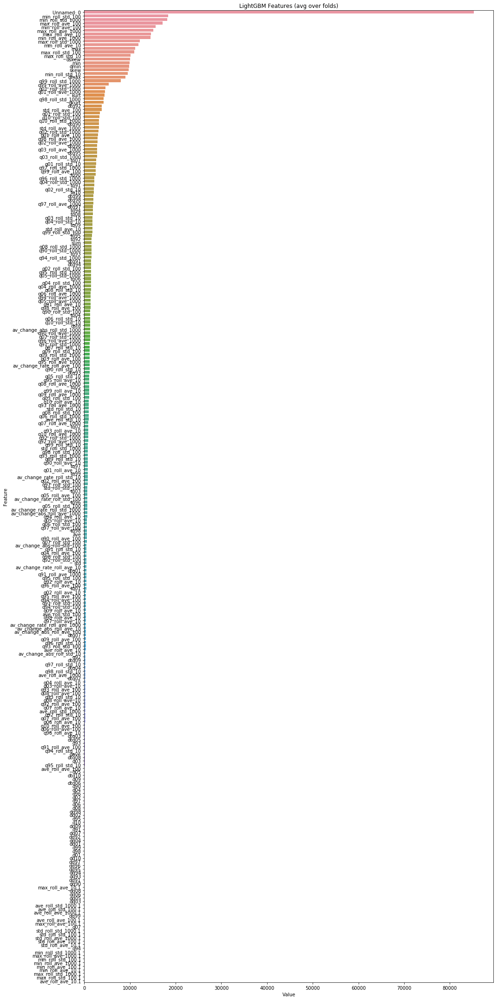

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns

feature_imp = pd.DataFrame(sorted(zip(gbm.feature_importances_,X_train.columns)), columns=['Value','Feature'])

plt.figure(figsize=(15, 30))
sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False))
plt.title('LightGBM Features (avg over folds)')
plt.tight_layout()
plt.show()

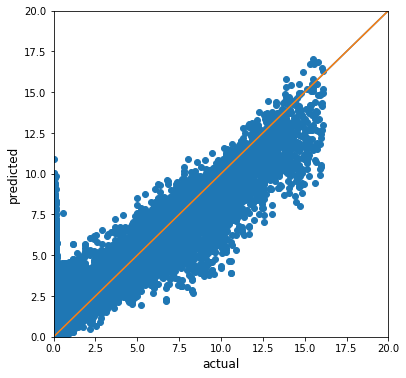

In [0]:
plt.figure(figsize=(6, 6))
plt.scatter(y_valid.values.flatten(), y_pred)
plt.xlim(0, 20)
plt.ylim(0, 20)
plt.xlabel('actual', fontsize=12)
plt.ylabel('predicted', fontsize=12)
plt.plot([(0, 0), (20, 20)], [(0, 0), (20, 20)])
plt.show()

In [0]:
y_submit = gbm.predict(X_submit)

In [0]:
X_submit.dtypes

Unnamed: 0           float64
ave                  float64
std                  float64
max                  float64
min                  float64
dave                 float64
dstd                 float64
dmax                 float64
dmin                 float64
q01                  float64
q02                  float64
q03                  float64
q04                  float64
q05                  float64
q06                  float64
q07                  float64
q08                  float64
q09                  float64
q10                  float64
q90                  float64
q91                  float64
q92                  float64
q93                  float64
q94                  float64
q95                  float64
q96                  float64
q97                  float64
q98                  float64
q99                  float64
dq01                 float64
                      ...   
q90_roll_ave_100     float64
q91_roll_ave_100     float64
q92_roll_ave_100     float64
q93_roll_ave_1

In [0]:
submission['time_to_failure'] = y_submit
print(submission.head())
submission.to_csv('submission_Lan_NewParams1.csv')

            time_to_failure
seg_id                     
seg_00030f         2.833405
seg_0012b5         4.331567
seg_00184e         4.249257
seg_003339         9.559475
seg_0042cc         7.024221
